# Cartpole Bayesian Sindy with Intuitive Basis Functions

The full cartpole equations are:

$$\ddot{x}=\frac{f-ml\ddot{\theta}\cos{\theta} +ml\dot{\theta}^2\sin{\theta}-\mu_c\dot{x}}{m_c + m}$$

$$\ddot{\theta}=\frac{Mg\sin{\theta} -\cos{\theta}(f +ml\dot{\theta}^2\sin{\theta}-\mu_c\dot{x})-\frac{M\mu_p\dot{\theta}}{ml}}{(1+k)Ml-ml\cos^2{\theta}}$$

In [2]:
using Turing, DifferentialEquations, StatsPlots, LinearAlgebra, Random

## Sim Data

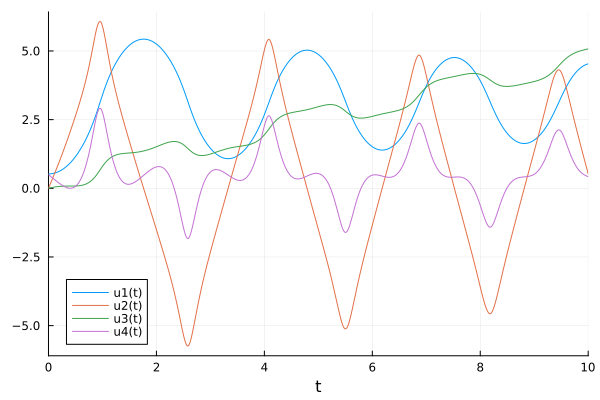

In [11]:
function cartpole!(du, u, p, t)
    # u = [theta, theta_d, x, x_d]

    # external force
    # force = -0.2+0.5*sin(6*t)
    force = 0

    # Parameters
    m1, m2, gravity, length, mu_c, mu_p, k_inertia = p

    # theta_d
    du[1] = u[2]

    # theta_dd
    du[2] = ((m1+m2)*gravity*sin(u[1])-cos(u[1])*(force+m2*length*(u[2]^2)*sin(u[1])-mu_c*u[4])-((m1+m2)*mu_p*u[2])/(m2*length)) / ((m1+m2)*(k_inertia+1)*length - m2*length*(cos(u[1]))^2)

    # x_d
    du[3] = u[4]

    # x_dd
    du[4] = (force-m2*length*(du[2]*cos(u[1])-(u[2]^2)*sin(u[1]))-mu_c*u[4]) / (m1+m2)
end

# Parameters 
# p = (1.0, 0.1, 9.8, 0.5, 0.05, 0.01, 1/3)
p = (1.5, 1.0, 9.8, 1.0, 0.05, 0.1, 1/3)

# Initial conditions
u0_1 = [0.524, 0.0, 0.0, 0.5]  # 30 degrees, 2 m/s to the right
u0_2 = [-0.785, -4.0, 0.0, -1.0]  # 45 degrees to left, 2 rad./s clockwise angular velocity, 2 m/s to the right

tspan = (0.0,10.0)
probCart1 = ODEProblem(cartpole!,u0_1,tspan,p)
probCart2 = ODEProblem(cartpole!,u0_2,tspan,p)

# Solve
sol1 = solve(probCart1, Tsit5())
sol2 = solve(probCart2, Tsit5())

X = Array(sol1)
t = sol1.t
DX = Array(sol1(sol1.t,Val{1}))[[2], :]

plot(sol1)


$$\ddot{x}=\frac{f-ml\ddot{\theta}\cos{\theta} +ml\dot{\theta}^2\sin{\theta}-\mu_c\dot{x}}{m_c + m}$$

$$\ddot{\theta}=\frac{Mg\sin{\theta} -\cos{\theta}(f +ml\dot{\theta}^2\sin{\theta}-\mu_c\dot{x})-\frac{M\mu_p\dot{\theta}}{ml}}{(1+k)Ml-ml\cos^2{\theta}}$$

### Generate dummy data for estimation

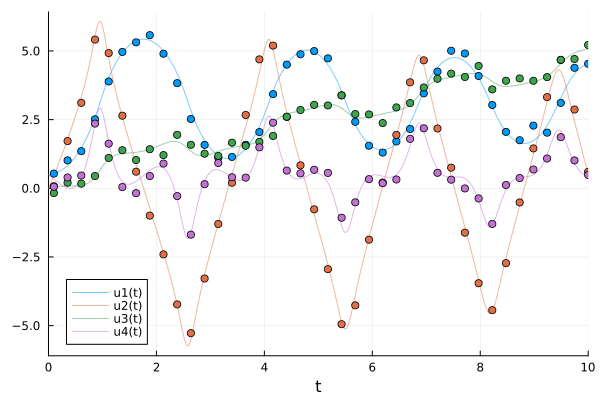

In [6]:
t = collect(range(0.1, stop=10, length=40))

odedata1 = Array(solve(probCart1, saveat=t))
odedata1 = odedata1 + 0.2 * randn(size(odedata1))

plot(sol1; alpha=0.5)
scatter!(t, odedata1'; color=[1 2 3 4], label="")


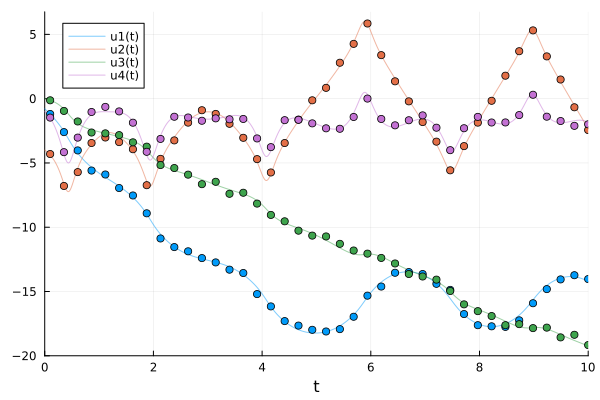

In [12]:
t = collect(range(0.1, stop=10, length=40))

odedata2 = Array(solve(probCart2, saveat=t))
odedata2 = odedata2 + 0.2 * randn(size(odedata2))

plot(sol2; alpha=0.5)
scatter!(t, odedata2'; color=[1 2 3 4], label="")


## Parameter Estimation

The purpose of this notebook is to encode *some* information in the basis functions; namely:

* Friction: it is expected both \ddot{\theta} and \ddot{x} will have a small negative coefficient for \dot{\theta} and \dot{x}, respectively.
* Angle importance: *All* other basis functions will involve \sin{\theta} or \cos{\theta}. This is based on intuition--observing the system, the angle of the pendulum is the driving force in how the system responds


In [23]:
#| output: false
function cartpoleSindy!(du, u, p, t)
     # u = [theta, theta_d, x, x_d]
 
     θ, θ̇, x, ẋ = u
 
     # Set epsilon for stability
     eps = 1e-3

     # theta_d and x_d
     du[1] = θ̇ - eps*θ^3
     du[3] = ẋ - eps*x^3
 
     # theta_dd
     θ̈ = (p[1]*sin(θ) +
          p[2]*cos(θ) + 
          p[3]*θ̇ *sin(θ)+ 
          p[4]*ẋ *sin(θ)+ 
          p[5]*ẋ *cos(θ)+ 
          p[6]*cos(θ) *θ̇ + 
          p[7]*cos(θ) *sin(θ)+ 
          p[8]*cos(θ)^2+ 
          p[9]*sin(θ)^2+ 
          p[10]*θ̇ *cos(θ) *sin(θ)+ 
          p[11]*θ̇ *cos(θ)^2+ 
          p[12]*θ̇ *sin(θ)^2+ 
          p[13]*ẋ*cos(θ)*sin(θ)+ 
          p[14]*ẋ*cos(θ)^2+ 
          p[15]*ẋ*sin(θ)^2+ 
          p[38]*θ̇ +
          p[16] -
          eps*θ̇ ^3  # for stability
          )
     du[2] = θ̈ 
     
     # x_dd
     du[4] = (p[17]*sin(θ) +
              p[18]*cos(θ)+ 
              p[19]*θ̇ *sin(θ)+ 
              p[20]*ẋ *sin(θ)+ 
              p[21]*θ̈ *sin(θ)+ 
              p[22]*ẋ *cos(θ)+ 
              p[23]*cos(θ) *θ̇+ 
              p[24]*cos(θ) *θ̈ + 
              p[25]*cos(θ) *sin(θ)+ 
              p[26]*sin(θ)^2+ 
              p[27]*cos(θ)^2+ 
              p[28]*ẋ*cos(θ) *sin(θ)+ 
              p[29]*ẋ*sin(θ)^2+ 
              p[30]*ẋ*cos(θ)^2+ 
              p[31]*θ̇ *cos(θ) *sin(θ)+ 
              p[32]*θ̇ *sin(θ)^2+ 
              p[33]*θ̇ *cos(θ)^2+ 
              p[34]*θ̈ *cos(θ) *sin(θ)+ 
              p[35]*θ̈ *sin(θ)^2+ 
              p[36]*θ̈ *cos(θ)^2+ 
              p[39]*ẋ+
              p[37] -
              eps*ẋ^3  # for stability
              )
 end
cartpoleProb1 = ODEProblem(cartpoleSindy!, u0_1, tspan, [0.0 for _ in 1:39])
cartpoleProb2 = ODEProblem(cartpoleSindy!, u0_2, tspan, [0.0 for _ in 1:39])

ODEProblem with uType Vector{Float64} and tType Float64. In-place: true
timespan: (0.0, 10.0)
u0: 4-element Vector{Float64}:
 -0.785
 -4.0
  0.0
 -1.0

In [27]:
#| output: false
@model function fitCartpoleLaplace(data1, data2, ::Type{T} = Float64) where {T <: Real}

    # Prior distributions - small except for base sin and cosine terms
    se = [
        1.0,
        1.0,
        0.1,
        0.1, 
        0.1, 
        0.1, 
        0.1, 
        0.1,
        0.1,
        0.1,
        0.1,
        0.1,
        0.1,
        0.1,
        0.1,
        0.1,
        1.0,
        1.0,
        0.1,
        0.1,
        0.1,
        0.1,
        0.1,
        0.1,
        0.1,
        0.1,
        0.1,
        0.1,
        0.1,
        0.1,
        0.1,
        0.1,
        0.1,
        0.1,
        0.1,
        0.1,
        0.1,
    ]
    base_priors = [Laplace(0.0, se[i]) for i in 1:37]
    neg_priors = [Truncated(Laplace(0.0, 0.1), -Inf, 0) for _ in 1:2]
    priors = vcat(base_priors, neg_priors)
    # priors = [Laplace(0.0, 0.1) for i in 1:36]
    theta = Vector{T}(undef, length(priors))
    syms = [Turing.@varname(theta[i]) for i in 1:length(priors)]
    for i in 1:length(priors)
        theta[i] ~ NamedDist(priors[i], syms[i])
    end

    σ ~ InverseGamma(2, 0.5)

    p = convert.(T, theta)
    # u0 = convert.(T, cartpoleProb.u0)

    # Simulate model
    predicted1 = solve(cartpoleProb1, Tsit5(); p=p, saveat=t)
    predicted_dense1 = solve(cartpoleProb1, Tsit5(); p=p)
    failure1 = size(predicted1, 2) < length(t)

    if failure1
        Turing.@addlogprob! -Inf
        return
    end

    # Simulate second model
    predicted2 = solve(cartpoleProb2, Tsit5(); p=p, saveat=t)
    predicted_dense2 = solve(cartpoleProb2, Tsit5(); p=p)
    failure2 = size(predicted2, 2) < length(t)

    if failure2
        Turing.@addlogprob! -Inf
        return
    end

    # Observations
    for i in 1:length(t)
        data1[:, i] ~ MvNormal(predicted1[:, i], σ^2 * I)
        data2[:, i] ~ MvNormal(predicted2[:, i], σ^2 * I)
    end

    # return nothing
    return (; theta, predicted_dense1, predicted_dense2)
end


fitCartpoleLaplace (generic function with 3 methods)

In [25]:
#| output: false
using Suppressor

modelHorse = fitCartpoleLaplace(odedata1, odedata2)
# chain5 = 6
# output = @capture_err chain5 = sample(modelHorse, NUTS(0.65; init_ϵ=0.01), MCMCSerial(), 500, 2; progress=true)
# chain5

chain5 = sample(modelHorse, NUTS(0.65; init_ϵ=0.01), MCMCSerial(), 500, 2; progress=true)

Sampling (Chain 1 of 2)   0%|█                          |  ETA: N/A
Sampling (Chain 1 of 2)   0%|█                          |  ETA: 1:14:08
Sampling (Chain 1 of 2)   1%|█                          |  ETA: 0:38:30
Sampling (Chain 1 of 2)   1%|█                          |  ETA: 0:28:51
Sampling (Chain 1 of 2)   2%|█                          |  ETA: 0:24:09
Sampling (Chain 1 of 2)   2%|█                          |  ETA: 0:30:20
Sampling (Chain 1 of 2)   2%|█                          |  ETA: 0:47:24
Sampling (Chain 1 of 2)   3%|█                          |  ETA: 1:04:19
Sampling (Chain 1 of 2)   3%|█                          |  ETA: 1:00:08
Sampling (Chain 1 of 2)   4%|█                          |  ETA: 1:03:57
Sampling (Chain 1 of 2)   4%|██                         |  ETA: 1:05:40
Sampling (Chain 1 of 2)   4%|██                         |  ETA: 1:11:49
Sampling (Chain 1 of 2)   5%|██                         |  ETA: 1:14:25
Sampling (Chain 1 of 2)   5%|██                         |  ETA: 1:18

Sampling (Chain 1 of 2)  40%|███████████                |  ETA: 2:21:34
Sampling (Chain 1 of 2)  40%|███████████                |  ETA: 2:21:07
Sampling (Chain 1 of 2)  41%|████████████               |  ETA: 2:20:20
Sampling (Chain 1 of 2)  41%|████████████               |  ETA: 2:19:31
Sampling (Chain 1 of 2)  42%|████████████               |  ETA: 2:18:42
Sampling (Chain 1 of 2)  42%|████████████               |  ETA: 2:17:54
Sampling (Chain 1 of 2)  42%|████████████               |  ETA: 2:17:04
Sampling (Chain 1 of 2)  43%|████████████               |  ETA: 2:16:11
Sampling (Chain 1 of 2)  43%|████████████               |  ETA: 2:15:13
Sampling (Chain 1 of 2)  44%|████████████               |  ETA: 2:13:54
Sampling (Chain 1 of 2)  44%|████████████               |  ETA: 2:12:35
Sampling (Chain 1 of 2)  44%|████████████               |  ETA: 2:11:16
Sampling (Chain 1 of 2)  45%|█████████████              |  ETA: 2:09:57
Sampling (Chain 1 of 2)  45%|█████████████              |  ETA: 

Sampling (Chain 1 of 2)  80%|██████████████████████     |  ETA: 0:41:21
Sampling (Chain 1 of 2)  80%|██████████████████████     |  ETA: 0:40:28
Sampling (Chain 1 of 2)  80%|██████████████████████     |  ETA: 0:39:35
Sampling (Chain 1 of 2)  81%|██████████████████████     |  ETA: 0:38:41
Sampling (Chain 1 of 2)  81%|██████████████████████     |  ETA: 0:37:48
Sampling (Chain 1 of 2)  82%|███████████████████████    |  ETA: 0:36:56
Sampling (Chain 1 of 2)  82%|███████████████████████    |  ETA: 0:36:03
Sampling (Chain 1 of 2)  82%|███████████████████████    |  ETA: 0:35:11
Sampling (Chain 1 of 2)  83%|███████████████████████    |  ETA: 0:34:19
Sampling (Chain 1 of 2)  83%|███████████████████████    |  ETA: 0:33:27
Sampling (Chain 1 of 2)  84%|███████████████████████    |  ETA: 0:32:37
Sampling (Chain 1 of 2)  84%|███████████████████████    |  ETA: 0:31:47
Sampling (Chain 1 of 2)  84%|███████████████████████    |  ETA: 0:30:57
Sampling (Chain 1 of 2)  85%|███████████████████████    |  ETA: 

┌ Warning: Interrupted. Larger maxiters is needed. If you are using an integrator for non-stiff ODEs or an automatic switching algorithm (the default), you may want to consider using a method for stiff equations. See the solver pages for more details (e.g. https://docs.sciml.ai/DiffEqDocs/stable/solvers/ode_solve/#Stiff-Problems).
└ @ SciMLBase C:\Users\robert.robison\.julia\packages\SciMLBase\QqtZA\src\integrator_interface.jl:504
┌ Warning: Interrupted. Larger maxiters is needed. If you are using an integrator for non-stiff ODEs or an automatic switching algorithm (the default), you may want to consider using a method for stiff equations. See the solver pages for more details (e.g. https://docs.sciml.ai/DiffEqDocs/stable/solvers/ode_solve/#Stiff-Problems).
└ @ SciMLBase C:\Users\robert.robison\.julia\packages\SciMLBase\QqtZA\src\integrator_interface.jl:504
┌ Warning: Interrupted. Larger maxiters is needed. If you are using an integrator for non-stiff ODEs or an automatic switching alg

Sampling (Chain 2 of 2)  29%|████████                   |  ETA: 1:33:38
Sampling (Chain 2 of 2)  29%|████████                   |  ETA: 1:33:32
Sampling (Chain 2 of 2)  30%|████████                   |  ETA: 1:33:34
Sampling (Chain 2 of 2)  30%|█████████                  |  ETA: 1:33:33
Sampling (Chain 2 of 2)  30%|█████████                  |  ETA: 1:33:28
Sampling (Chain 2 of 2)  31%|█████████                  |  ETA: 1:33:20
Sampling (Chain 2 of 2)  31%|█████████                  |  ETA: 1:33:17
Sampling (Chain 2 of 2)  32%|█████████                  |  ETA: 1:33:07
Sampling (Chain 2 of 2)  32%|█████████                  |  ETA: 1:32:54
Sampling (Chain 2 of 2)  32%|█████████                  |  ETA: 1:32:39
Sampling (Chain 2 of 2)  33%|█████████                  |  ETA: 1:32:26
Sampling (Chain 2 of 2)  33%|█████████                  |  ETA: 1:32:12
Sampling (Chain 2 of 2)  34%|██████████                 |  ETA: 1:32:05
Sampling (Chain 2 of 2)  34%|██████████                 |  ETA: 

Sampling (Chain 2 of 2)  69%|███████████████████        |  ETA: 0:46:49
Sampling (Chain 2 of 2)  69%|███████████████████        |  ETA: 0:46:12
Sampling (Chain 2 of 2)  70%|███████████████████        |  ETA: 0:45:36
Sampling (Chain 2 of 2)  70%|███████████████████        |  ETA: 0:45:00
Sampling (Chain 2 of 2)  70%|████████████████████       |  ETA: 0:44:25
Sampling (Chain 2 of 2)  71%|████████████████████       |  ETA: 0:43:49
Sampling (Chain 2 of 2)  71%|████████████████████       |  ETA: 0:43:13
Sampling (Chain 2 of 2)  72%|████████████████████       |  ETA: 0:42:36
Sampling (Chain 2 of 2)  72%|████████████████████       |  ETA: 0:42:00
Sampling (Chain 2 of 2)  72%|████████████████████       |  ETA: 0:41:24
Sampling (Chain 2 of 2)  73%|████████████████████       |  ETA: 0:40:48
Sampling (Chain 2 of 2)  73%|████████████████████       |  ETA: 0:40:12
Sampling (Chain 2 of 2)  74%|████████████████████       |  ETA: 0:39:36
Sampling (Chain 2 of 2)  74%|████████████████████       |  ETA: 

Chains MCMC chain (500×52×2 Array{Float64, 3}):

Iterations        = 251:1:750
Number of chains  = 2
Samples per chain = 500
Wall duration     = 20315.48 seconds
Compute duration  = 20314.75 seconds
parameters        = theta[1], theta[2], theta[3], theta[4], theta[5], theta[6], theta[7], theta[8], theta[9], theta[10], theta[11], theta[12], theta[13], theta[14], theta[15], theta[16], theta[17], theta[18], theta[19], theta[20], theta[21], theta[22], theta[23], theta[24], theta[25], theta[26], theta[27], theta[28], theta[29], theta[30], theta[31], theta[32], theta[33], theta[34], theta[35], theta[36], theta[37], theta[38], theta[39], σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters      mean       std   naive_se      mcse       ess      rhat   es ⋯
      Symbol   Float64   Float64    Float64   Float64 

In [26]:
#| output: false
# Save/read samples
path = "../../learnedModels/bayesianSindy/chain-cartpole-multiple.jls"
if @isdefined chain5
    write(path, chain5)
else
    chain5 = read(path, Chains)
end

In [28]:
#| output: false
using DataFramesMeta

finnish_chain = generated_quantities(modelHorse, MCMCChains.get_sections(chain5, :parameters))
finnish_df = reduce(vcat, DataFrame(finnish_chain[:, i]) for i in 1:size(finnish_chain, 2));


In [39]:
# #| output: false
# #| echo: false
# using DataFrames

# # Extract coefficient samples

# # Clean data from generated quantites
# samples = size(finnish_chain, 1)
# var_str = [
#     "\$sin(θ) \\rightarrow \\ddot{θ}\$",
#     "\$cos(θ) \\rightarrow \\ddot{θ}\$",
#     # "\$\\dot{x} \\rightarrow \\ddot{θ}\$",
#     "\$\\dot{θ} * sin(θ) \\rightarrow \\ddot{θ}\$",
#     "\$\\dot{x} * sin(θ) \\rightarrow \\ddot{θ}\$",
#     # "\$\\dot{x} * \\dot{θ} \\rightarrow \\ddot{θ}\$",
#     "\$cos(θ) * sin(θ) \\rightarrow \\ddot{θ}\$",
#     "\$\\dot{x} * cos(θ) \\rightarrow \\ddot{θ}\$",
#     "\$cos(θ) * \\dot{θ} \\rightarrow \\ddot{θ}\$",
#     "\$cos(θ)^2 \\rightarrow \\ddot{θ}\$",
#     "\$sin(θ)^2 \\rightarrow \\ddot{θ}\$",
#     "\$const \\rightarrow \\ddot{θ}\$",
#     # "\$\\dot{θ}^2 \\rightarrow \\ddot{θ}\$",
#     # "\$\\dot{x}^2 \\rightarrow \\ddot{θ}\$",
#     "\$sin(θ) \\rightarrow \\ddot{x}\$",
#     "\$cos(θ) \\rightarrow \\ddot{x}\$",
#     # "\$\\dot{θ} \\rightarrow \\ddot{x}\$",
#     # "\$\\ddot{θ} \\rightarrow \\ddot{x}\$",
#     "\$\\dot{θ} * sin(θ) \\rightarrow \\ddot{x}\$",
#     "\$\\dot{x} * sin(θ) \\rightarrow \\ddot{x}\$",
#     # "\$\\dot{x} * \\dot{θ} \\rightarrow \\ddot{x}\$",
#     "\$\\ddot{θ} * sin(θ) \\rightarrow \\ddot{x}\$",
#     # "\$\\dot{x} * \\ddot{θ} \\rightarrow \\ddot{x}\$",
#     # "\$\\ddot{θ} * \\dot{θ} \\rightarrow \\ddot{x}\$",
#     "\$\\dot{x} * cos(θ) \\rightarrow \\ddot{x}\$", #placeholder
#     "\$cos(θ) * \\dot{θ} \\rightarrow \\ddot{x}\$",
#     "\$cos(θ) * sin(θ) \\rightarrow \\ddot{x}\$",
#     "\$cos(θ) * \\ddot{θ} \\rightarrow \\ddot{x}\$",
#     "\$sin(θ)^2 \\rightarrow \\ddot{x}\$",
#     "\$cos(θ)^2 \\rightarrow \\ddot{x}\$",
#     # "\$\\dot{θ}^2 \\rightarrow \\ddot{x}\$",
#     # "\$\\ddot{θ}^2 \\rightarrow \\ddot{x}\$",
#     # "\$\\dot{x}^2 \\rightarrow \\ddot{x}\$",
#     "\$const \\rightarrow \\ddot{x}\$",
#     "\$\\dot{θ} \\rightarrow \\ddot{θ}\$",
#     "\$\\dot{x} \\rightarrow \\ddot{x}\$",
# ]
# beta1 = DataFrame([finnish_chain[i, 1][:theta] for i in 1:samples], :auto)
# # beta1[!,:var] = var_str
# beta1[!,:chain] = [1 for _ in 1:size(beta1)[1]]
# beta1 = DataFrames.stack(beta1, 1:samples)
# beta2 = DataFrame([finnish_chain[i, 2][:theta] for i in 1:samples], :auto)
# # beta2[!,:var] = var_str
# beta2[!,:chain] = [2 for _ in 1:size(beta2)[1]]
# beta2 = DataFrames.stack(beta2, 1:samples)
# beta = vcat(beta1, beta2)
# beta

Row,chain,variable,value
,Int64,String,Float64
1,1,x1,6.86883
2,1,x1,1.76167
3,1,x1,-0.209055
4,1,x1,0.984134
5,1,x1,0.853416
6,1,x1,-0.27426
7,1,x1,-0.215861
8,1,x1,-0.0904015
9,1,x1,0.247807


In [29]:
#| output: false
using DataFrames

# Extract coefficient samples

# Clean data from generated quantites
samples = size(finnish_chain, 1)
var_str = [
    "\$sin(θ) \\rightarrow \\ddot{θ}\$",
    "\$cos(θ) \\rightarrow \\ddot{θ}\$",
    # "\$\\dot{x} \\rightarrow \\ddot{θ}\$",
    "\$\\dot{θ} * sin(θ) \\rightarrow \\ddot{θ}\$",
    "\$\\dot{x} * sin(θ) \\rightarrow \\ddot{θ}\$",
    # "\$\\dot{x} * \\dot{θ} \\rightarrow \\ddot{θ}\$",
    "\$\\dot{x} * cos(θ) \\rightarrow \\ddot{θ}\$",
    "\$cos(θ) * \\dot{θ} \\rightarrow \\ddot{θ}\$",
    "\$cos(θ) * sin(θ) \\rightarrow \\ddot{θ}\$",
    "\$cos(θ)^2 \\rightarrow \\ddot{θ}\$",
    "\$sin(θ)^2 \\rightarrow \\ddot{θ}\$",
    "\$\\dot{\theta} * cos(θ) * sin(θ) \\rightarrow \\ddot{θ}\$",
    "\$\\dot{\theta} * sin(θ)^2 \\rightarrow \\ddot{θ}\$",
    "\$\\dot{\theta} * cos(θ)^2 \\rightarrow \\ddot{θ}\$",
    "\$\\dot{x} * cos(θ) * sin(θ) \\rightarrow \\ddot{θ}\$",
    "\$\\dot{x} * sin(θ)^2 \\rightarrow \\ddot{θ}\$",
    "\$\\dot{x} * cos(θ)^2 \\rightarrow \\ddot{θ}\$",
    "\$const \\rightarrow \\ddot{θ}\$",
    # "\$\\dot{θ}^2 \\rightarrow \\ddot{θ}\$",
    # "\$\\dot{x}^2 \\rightarrow \\ddot{θ}\$",
    "\$sin(θ) \\rightarrow \\ddot{x}\$",
    "\$cos(θ) \\rightarrow \\ddot{x}\$",
    # "\$\\dot{θ} \\rightarrow \\ddot{x}\$",
    # "\$\\ddot{θ} \\rightarrow \\ddot{x}\$",
    "\$\\dot{θ} * sin(θ) \\rightarrow \\ddot{x}\$",
    "\$\\dot{x} * sin(θ) \\rightarrow \\ddot{x}\$",
    # "\$\\dot{x} * \\dot{θ} \\rightarrow \\ddot{x}\$",
    "\$\\ddot{θ} * sin(θ) \\rightarrow \\ddot{x}\$",
    # "\$\\dot{x} * \\ddot{θ} \\rightarrow \\ddot{x}\$",
    # "\$\\ddot{θ} * \\dot{θ} \\rightarrow \\ddot{x}\$",
    "\$\\dot{x} * cos(θ) \\rightarrow \\ddot{x}\$", #placeholder
    "\$cos(θ) * \\dot{θ} \\rightarrow \\ddot{x}\$",
    "\$cos(θ) * \\ddot{θ} \\rightarrow \\ddot{x}\$",
    "\$cos(θ) * sin(θ) \\rightarrow \\ddot{x}\$",
    "\$sin(θ)^2 \\rightarrow \\ddot{x}\$",
    "\$cos(θ)^2 \\rightarrow \\ddot{x}\$",
    "\$\\dot{x} * cos(θ) * sin(θ) \\rightarrow \\ddot{x}\$",
    "\$\\dot{x} * sin(θ)^2 \\rightarrow \\ddot{x}\$",
    "\$\\dot{x} * cos(θ)^2 \\rightarrow \\ddot{x}\$",
    "\$\\dot{\theta} * cos(θ) * sin(θ) \\rightarrow \\ddot{x}\$",
    "\$\\dot{\theta} * sin(θ)^2 \\rightarrow \\ddot{x}\$",
    "\$\\dot{\theta} * cos(θ)^2 \\rightarrow \\ddot{x}\$",
    "\$\\ddot{\theta} * cos(θ) * sin(θ) \\rightarrow \\ddot{x}\$",
    "\$\\ddot{\theta} * sin(θ)^2 \\rightarrow \\ddot{x}\$",
    "\$\\ddot{\theta} * cos(θ)^2 \\rightarrow \\ddot{x}\$",
    # "\$\\dot{θ}^2 \\rightarrow \\ddot{x}\$",
    # "\$\\ddot{θ}^2 \\rightarrow \\ddot{x}\$",
    # "\$\\dot{x}^2 \\rightarrow \\ddot{x}\$",
    "\$const \\rightarrow \\ddot{x}\$",
    "\$\\dot{θ} \\rightarrow \\ddot{θ}\$",
    "\$\\dot{x} \\rightarrow \\ddot{x}\$",
]
beta1 = DataFrame([finnish_chain[i, 1][:theta] for i in 1:samples], :auto)
beta1[!,:var] = var_str
beta1[!,:chain] = [1 for _ in 1:size(beta1)[1]]
beta1 = DataFrames.stack(beta1, 1:samples)
beta2 = DataFrame([finnish_chain[i, 2][:theta] for i in 1:samples], :auto)
beta2[!,:var] = var_str
beta2[!,:chain] = [2 for _ in 1:size(beta2)[1]]
beta2 = DataFrames.stack(beta2, 1:samples)
beta = vcat(beta1, beta2)
beta

Row,var,chain,variable,value
,String,Int64,String,Float64
1,$sin(θ) \\rightarrow \\ddot{θ}$,1,x1,7.07658
2,$cos(θ) \\rightarrow \\ddot{θ}$,1,x1,-0.337351
3,$\\dot{θ} * sin(θ) \\rightarrow \\ddot{θ}$,1,x1,-0.602657
4,$\\dot{x} * sin(θ) \\rightarrow \\ddot{θ}$,1,x1,1.85041
5,$\\dot{x} * cos(θ) \\rightarrow \\ddot{θ}$,1,x1,1.37527
6,$cos(θ) * \\dot{θ} \\rightarrow \\ddot{θ}$,1,x1,-0.0242548
7,$cos(θ) * sin(θ) \\rightarrow \\ddot{θ}$,1,x1,-0.103923
8,$cos(θ)^2 \\rightarrow \\ddot{θ}$,1,x1,0.0671617
9,$sin(θ)^2 \\rightarrow \\ddot{θ}$,1,x1,0.0763507


In [30]:
#| output: false
gd = groupby(beta, [:var, :chain])
show(combine(gd, :value => mean), allrows=true)

78×3 DataFrame
 Row │ var                                chain  value_mean  
     │ String                             Int64  Float64     
─────┼───────────────────────────────────────────────────────
   1 │ $sin(θ) \\rightarrow \\ddot{θ}$        1   7.49113
   2 │ $cos(θ) \\rightarrow \\ddot{θ}$        1  -1.10139
   3 │ $\\dot{θ} * sin(θ) \\rightarrow …      1  -0.640899
   4 │ $\\dot{x} * sin(θ) \\rightarrow …      1   1.90283
   5 │ $\\dot{x} * cos(θ) \\rightarrow …      1   0.992973
   6 │ $cos(θ) * \\dot{θ} \\rightarrow …      1   0.0239606
   7 │ $cos(θ) * sin(θ) \\rightarrow \\…      1   0.0120769
   8 │ $cos(θ)^2 \\rightarrow \\ddot{θ}$      1  -0.0324762
   9 │ $sin(θ)^2 \\rightarrow \\ddot{θ}$      1  -0.0171657
  10 │ $\\dot{\theta} * cos(θ) * sin(θ)…      1   0.00586567
  11 │ $\\dot{\theta} * sin(θ)^2 \\righ…      1   0.0318525
  12 │ $\\dot{\theta} * cos(θ)^2 \\righ…      1   0.187873
  13 │ $\\dot{x} * cos(θ) * sin(θ) \\ri…      1  -0.0813595
  14 │ $\\dot{x} * sin(θ)^2

Estimated solved DE from additive equations:

#### $\ddot{\theta}$ Estimated DEs:

Both chains were roughly the same for this one; after averaging together coefficients:

$$
\ddot{\theta} = 7.45\sin{\theta}-1.13\cos{\theta} -0.67\dot{\theta}\sin{\theta} + 2.0\dot{x}\sin{\theta} + 0.99\dot{x}\cos{\theta} +0.2\dot{\theta}\cos{\theta}^2
$$

With the parameters used, the actual DEs are roughly:




$$
\ddot{\theta}=\frac{24.5\sin{\theta} -1.0\cos{\theta}\dot{\theta}^2\sin{\theta}+0.05\dot{x}\cos{\theta}-0.25\dot{\theta}}{3.33-1.0\cos^2{\theta}}\approx7.37\sin{\theta}-0.3cos{\theta}\dot{\theta}^2\sin{\theta}
$$


#### $\ddot{x}$ Estimated DEs:

The equations match less well between chains for $\ddot{x}$

##### Chain 1

$$
\ddot{x} = 0.57\sin{\theta}-0.1\dot{x}\cos{\theta} -0.21\dot{\theta}\sin{\theta}\cos{\theta} +0.37\dot{\theta}\sin{\theta}^2 -0.18\ddot{\theta}\cos{\theta}^2 +0.16\ddot{\theta}\sin{\theta}^2-0.11\dot{x}
$$

##### Chain 2

$$
\ddot{x} = -0.12\dot{\theta}\sin{\theta}-0.12\dot{x}\sin{\theta}-0.17\dot{x}\cos{\theta} -0.09\dot{\theta}\sin{\theta}\cos{\theta} +0.21\dot{\theta}\sin{\theta}^2+0.2\dot{\theta}\cos{\theta}^2  +0.20\ddot{\theta}\sin{\theta}^2
$$

$$\ddot{x}=\frac{-1.0\ddot{\theta}\cos{\theta} +1.0\dot{\theta}^2\sin{\theta}-0.05\dot{x}}{2.5}\approx-0.4\ddot{\theta}\cos{\theta} +0.4\dot{\theta}^2\sin{\theta}$$


With the parameters used, the actual DEs are roughly:


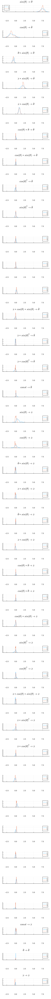

ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error
ERROR: syntax error


In [31]:
#| output: false
#| echo: false
gdf = groupby(beta, :var)
plot_list = []
for ((k,), v) in pairs(gdf)
    push!(plot_list, @df v density(:value, group=(:chain), title=k))
end

plot(plot_list..., layout=(length(plot_list), 1), size=(400, 200 * length(plot_list)), link = :x)
    


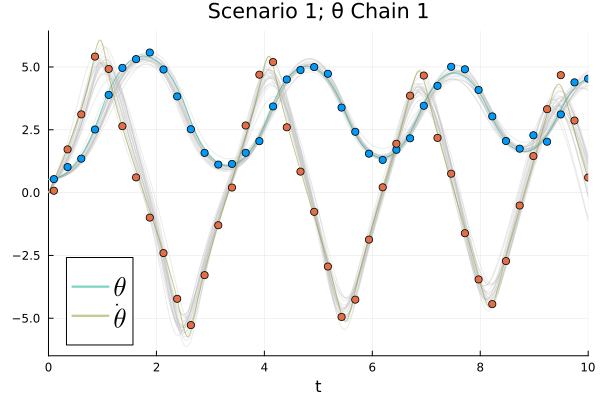

In [32]:
#| output: false
#| echo: false
plot(; title="Scenario 1; θ Chain 1", legendfontsize=18)
all_sol = finnish_df.predicted_dense1
for i in 1:25:500
    plot!(all_sol[i], idxs=[1, 2]; alpha=0.3, color="#BBBBBB", label="")
end

# Plot simulations and noise observations
plot!(sol1, idxs=[1, 2]; alpha=0.5, linewidth=1, legend=true, label=["\$\\theta\$" "\$\\dot{\\theta}\$"])
scatter!(t, odedata1[1:2, :]'; color=[1 2], label="")


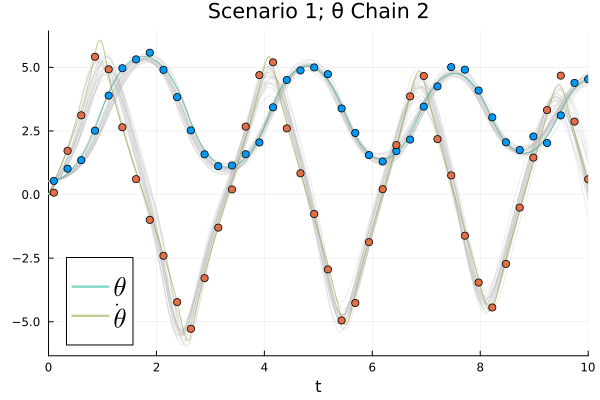

In [33]:
#| output: false
#| echo: false
plot(; title="Scenario 1; θ Chain 2", legendfontsize=18)
all_sol = finnish_df.predicted_dense1
for i in 501:25:1000
    plot!(all_sol[i], idxs=[1, 2]; alpha=0.3, color="#BBBBBB", label="")
end

# Plot simulations and noise observations
plot!(sol1, idxs=[1, 2]; alpha=0.5, linewidth=1, legend=true, label=["\$\\theta\$" "\$\\dot{\\theta}\$"])
scatter!(t, odedata1[1:2, :]'; color=[1 2], label="")


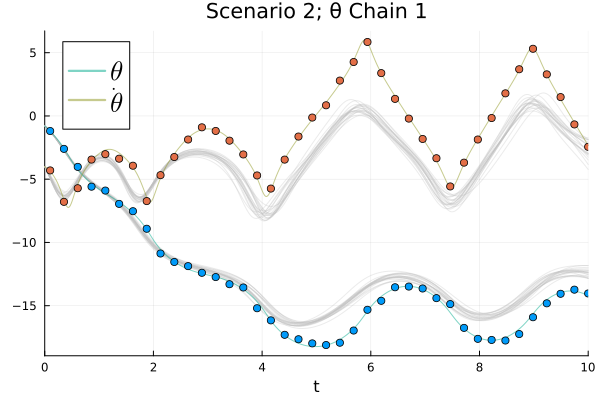

In [34]:
#| output: false
#| echo: false
plot(; title="Scenario 2; θ Chain 1", legendfontsize=18)
all_sol = finnish_df.predicted_dense2
for i in 1:25:500
    plot!(all_sol[i], idxs=[1, 2]; alpha=0.3, color="#BBBBBB", label="")
end

# Plot simulations and noise observations
plot!(sol2, idxs=[1, 2]; alpha=0.5, linewidth=1, legend=true, label=["\$\\theta\$" "\$\\dot{\\theta}\$"])
scatter!(t, odedata2[1:2, :]'; color=[1 2], label="")


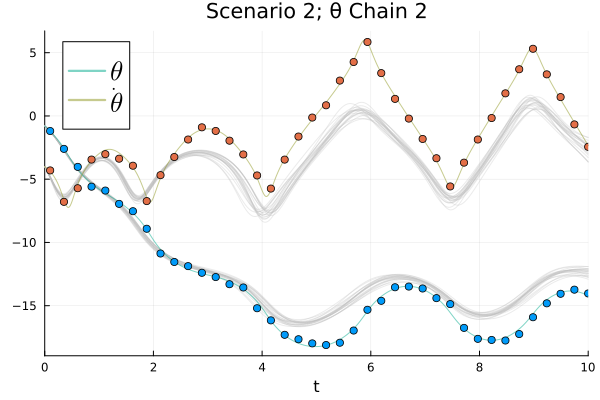

In [35]:
#| output: false
#| echo: false
plot(; title="Scenario 2; θ Chain 2", legendfontsize=18)
all_sol = finnish_df.predicted_dense2
for i in 501:25:1000
    plot!(all_sol[i], idxs=[1, 2]; alpha=0.3, color="#BBBBBB", label="")
end

# Plot simulations and noise observations
plot!(sol2, idxs=[1, 2]; alpha=0.5, linewidth=1, legend=true, label=["\$\\theta\$" "\$\\dot{\\theta}\$"])
scatter!(t, odedata2[1:2, :]'; color=[1 2], label="")


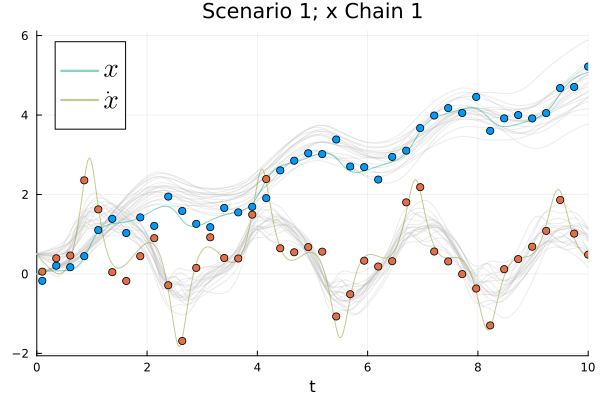

In [36]:
#| output: false
#| echo: false
plot(; title="Scenario 1; x Chain 1", legendfontsize=18)
all_sol = finnish_df.predicted_dense1
# for i in 1:size(finnish_df, 1)
for i in 1:25:500
    plot!(all_sol[i], idxs=[3, 4]; alpha=0.3, color="#BBBBBB", label="")
end

# Plot simulations and noise observations
plot!(sol1, idxs=[3, 4]; alpha=0.5, linewidth=1, label=["\$x\$" "\$\\dot{x}\$"])
scatter!(t, odedata1[3:4, :]'; color=[1 2], label="")


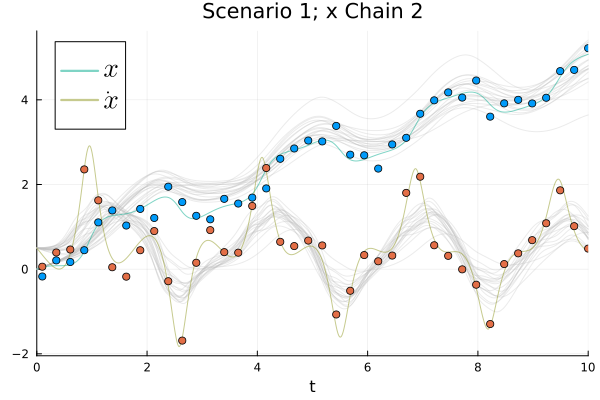

In [37]:
#| output: false
#| echo: false
plot(; title="Scenario 1; x Chain 2", legendfontsize=18)
all_sol = finnish_df.predicted_dense1
# for i in 1:size(finnish_df, 1)
for i in 501:25:1000
    plot!(all_sol[i], idxs=[3, 4]; alpha=0.3, color="#BBBBBB", label="")
end

# Plot simulations and noise observations
plot!(sol1, idxs=[3, 4]; alpha=0.5, linewidth=1, label=["\$x\$" "\$\\dot{x}\$"])
scatter!(t, odedata1[3:4, :]'; color=[1 2], label="")


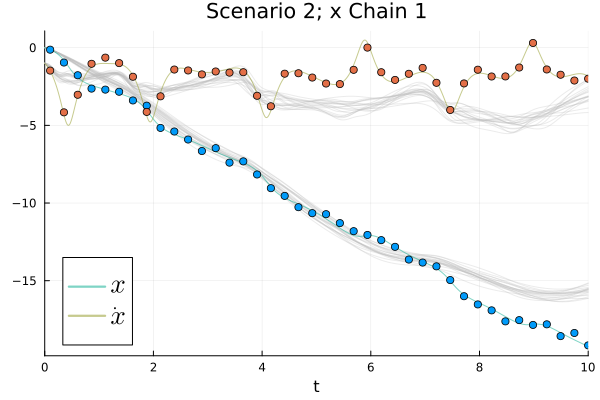

In [38]:
#| output: false
#| echo: false
plot(; title="Scenario 2; x Chain 1", legendfontsize=18)
all_sol = finnish_df.predicted_dense2
# for i in 1:size(finnish_df, 1)
for i in 1:25:500
    plot!(all_sol[i], idxs=[3, 4]; alpha=0.3, color="#BBBBBB", label="")
end

# Plot simulations and noise observations
plot!(sol2, idxs=[3, 4]; alpha=0.5, linewidth=1, label=["\$x\$" "\$\\dot{x}\$"])
scatter!(t, odedata2[3:4, :]'; color=[1 2], label="")


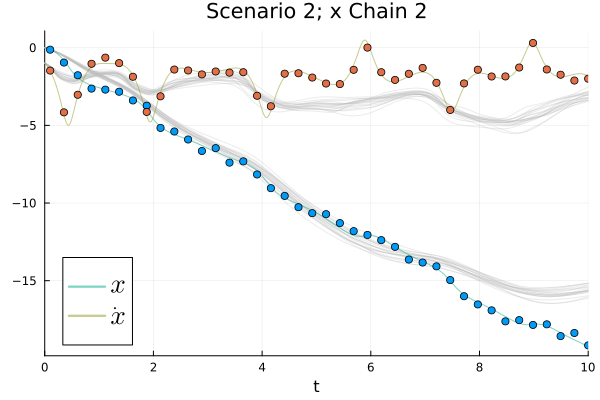

In [39]:
#| output: false
#| echo: false
plot(; title="Scenario 2; x Chain 2", legendfontsize=18)
all_sol = finnish_df.predicted_dense2
# for i in 1:size(finnish_df, 1)
for i in 501:25:1000
    plot!(all_sol[i], idxs=[3, 4]; alpha=0.3, color="#BBBBBB", label="")
end

# Plot simulations and noise observations
plot!(sol2, idxs=[3, 4]; alpha=0.5, linewidth=1, label=["\$x\$" "\$\\dot{x}\$"])
scatter!(t, odedata2[3:4, :]'; color=[1 2], label="")
